<a href="https://colab.research.google.com/github/Angelicarjs/obia_tutorials_DT/blob/main/edge_based_segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Setup**

Please run the cell below. After that, go to **Runtime -> Restart session**, and confirm. Once the session restarts, move on to the next cell **without running this one again**.

In [ ]:
# Check if running on Google Colab
if 'google.colab' in str(get_ipython()):
    import os
    repo_dir = "obia_tutorials"
    marker_file = os.path.join(repo_dir, ".setup_done")

    # Setup the environment only if it hasn't been done already
    if not os.path.exists(marker_file):
        # Clone the repository
        !git clone https://github.com/Angelicarjs/obia_tutorials_DT.git

        # Install the required packages
        !pip install -r obia_tutorials/requirements.txt

        # Create a marker file to avoid re-running the setup
        with open(marker_file, 'w') as f:
            f.write("Setup completed")

    cd ./obia_tutorials

Cloning into 'obia_tutorials'...
remote: Enumerating objects: 125, done.
remote: Counting objects: 100% (18/18), done.
remote: Compressing objects: 100% (16/16), done.
remote: Total 125 (delta 7), reused 5 (delta 2), pack-reused 107 (from 1)
Receiving objects: 100% (125/125), 93.26 MiB | 26.21 MiB/s, done.
Resolving deltas: 100% (52/52), done.
  Using cached ipykernel-6.22.0-py3-none-any.whl.metadata (6.4 kB)
  Using cached matplotlib-3.7.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (5.6 kB)
  Using cached nbformat-5.8.0-py3-none-any.whl.metadata (3.5 kB)
  Using cached numpy-1.24.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (5.6 kB)
  Using cached rasterio-1.3.10-cp311-cp311-manylinux2014_x86_64.whl.metadata (14 kB)
  Using cached scikit_image-0.20.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (16 kB)
  Using cached scikit_learn-1.2.2-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (11 kB)
  

In [ ]:
!pip install ploty.express

In [11]:
# Imports
import matplotlib.pyplot as plt
import numpy as np
import rasterio
from matplotlib import rcParams
import cv2
import numpy as np
import plotly.express as px
import skimage

# Set general figsize
rcParams['figure.figsize'] = (7.5, 7.5)

## **Edge based segmentation**

This code has the purpose of create a detector of cars usign edge-based segmentations. For that, first it creates a mask of square objects based on the threshold exercise, then create a function to detect the edges, apply the mask to the edges result to get rid of the vegetation objects. Further, it fills the edges to create blobs

## **Exemplary data**



For demonstration purposes, we will use an image that contains four bands: Red, Green, Blue, and Near-Infrared (NIR). Additionally, we will create two single-band grayscale images. The first image will show the average reflectance across the RGB bands, while the second image will represent the Normalized Difference Vegetation Index (NDVI).

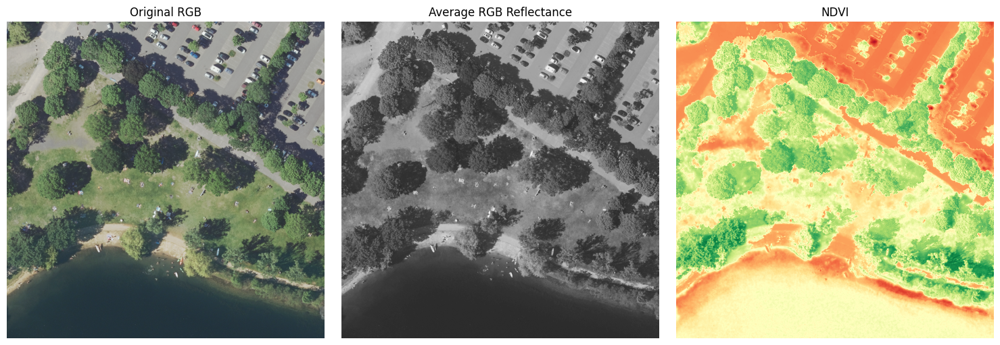

In [9]:
# File path to the image
img_path = './sample_data/ortho_subset_I.tif'

# Read the image and extract the bands
with rasterio.open(img_path) as src:
    # Extract red, green, blue, and NIR bands, normalize to [0, 1]
    bands = src.read([1, 2, 3, 4]).astype(float) / 255
    red, green, blue, nir = bands

# Stack RGB into an array and calculate average reflectance
rgb = np.stack([red, green, blue], axis=-1)
rgb_mean_reflectance = np.mean(rgb, axis=2)

# Calculate NDVI
ndvi = (nir - red) / (nir + red + 1e-6)  # small value added to avoid division by zero

# Create the figure for subplots
fig, axs = plt.subplots(ncols=3, figsize=(15, 5))

# Plot RGB, Average RGB Reflectance, and NDVI
axs[0].imshow(rgb)
axs[0].set_title("Original RGB")
axs[0].axis("off")

axs[1].imshow(rgb_mean_reflectance, cmap="gray")
axs[1].set_title("Average RGB Reflectance")
axs[1].axis("off")

axs[2].imshow(ndvi, cmap="RdYlGn")
axs[2].set_title("NDVI")
axs[2].axis("off")

plt.tight_layout()
plt.show()

#### **Mask creation**

Based on the threshold exercise, this code creates a mask of square elements, identifies them, and then dilates them. The results are first the mask without dilatation, then with the dilatation.

In [12]:
# Get Otsu threshold for NDVI and create mask (binary image where NDVI > threshold)
threshold = skimage.filters.threshold_otsu(ndvi)
print(threshold)
mask = ndvi > threshold

# Apply a median filter to the mask using a square structuring element of size 10
structuring_element = skimage.morphology.square(10)
filtered_mask = skimage.filters.median(mask, structuring_element)

#
px.imshow(filtered_mask).show()

# dilate the mask to make the trees bigger
filtered_mask = skimage.morphology.binary_dilation(filtered_mask, structuring_element)
px.imshow(filtered_mask).show()

0.1939102395938269


#### **Edge detector and dilation**

The edge_detector function processes an input image to detect edges using various image processing techniques. First, it ensures the image is in the correct format (uint8) by normalizing it if necessary. Then, it converts the image to grayscale and applies a Gaussian blur to reduce noise. The function utilizes the Canny edge detection algorithm, which internally applies the Sobel operator to compute the gradient magnitude and direction of the image. This helps detect sharp intensity changes that correspond to edges. After detecting edges with Canny, the function applies a dilation operation to connect nearby edges and then extracts contours from the processed image. The function returns the original edge map, the dilated edges, and the detected contours.

The results show the ed

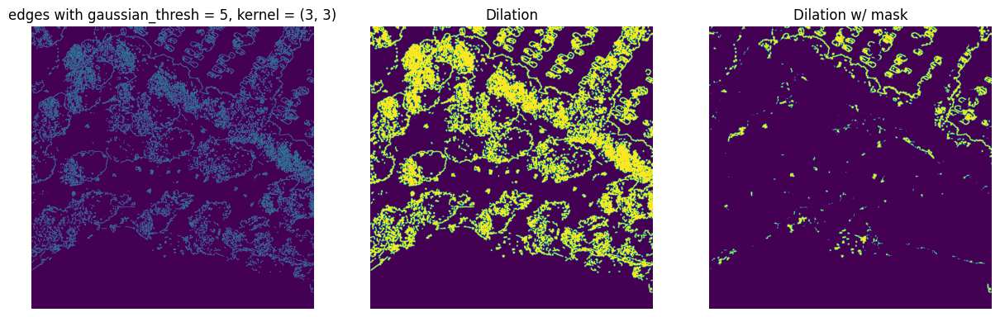

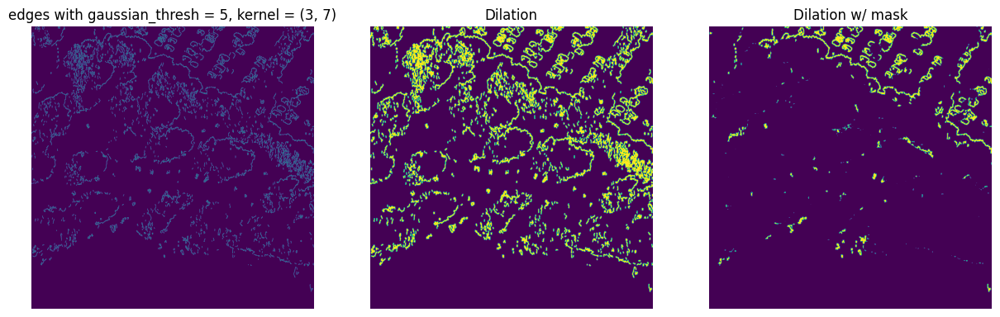

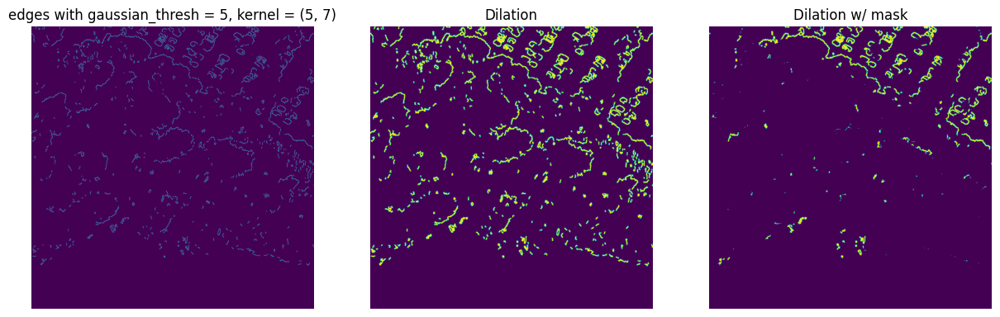

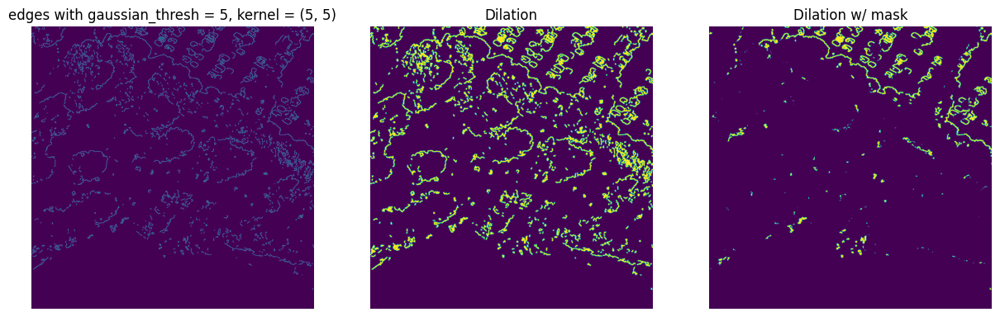

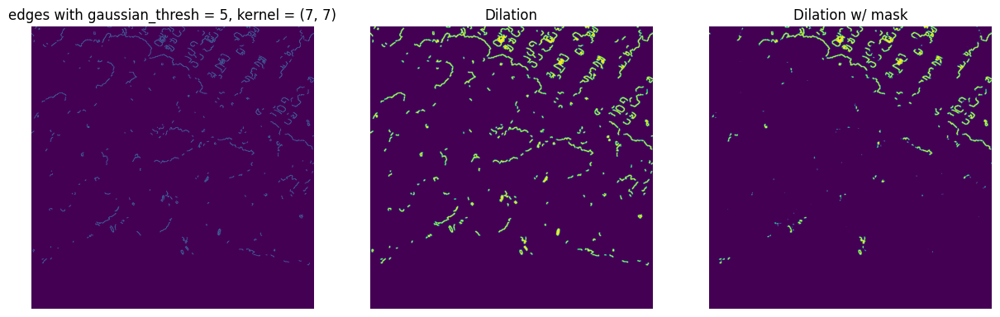

In [25]:


def edge_detector(image_array, gaussian_thresh = 0, kernel = (0,0)):

    # Convert float64 to uint8 (normalize first)
    if image_array.dtype != np.uint8:
        image_array = cv2.normalize(image_array, None, 0, 255, cv2.NORM_MINMAX)
        image_array = np.uint8(image_array)

    # Convert RGB to grayscale
    gray_image = cv2.cvtColor(image_array, cv2.COLOR_RGB2GRAY)

    # Apply GaussianBlur
    blurred = cv2.GaussianBlur(gray_image, kernel, gaussian_thresh)

    # Apply Canny edge detection
    # edges = cv2.Sobel(blurred, cv2.CV_8UC1, 1, 1, ksize=3, scale = 10)
    edges = cv2.Canny(blurred, 100,150)

    # Apply dilation to connect edges
    kernel = np.ones((5,5), np.uint8)
    dilated_edges = cv2.dilate(edges, kernel, iterations=1)

    # Fill connected components
    filled_edges = dilated_edges.copy()
    contours, _ = cv2.findContours(filled_edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    return edges, dilated_edges, contours

# Transpose the bands to (height, width, channels). Original was (4, 1500, 1500)
bands_transposed = np.transpose(bands, (1,2,0))

for k in [(3,3), (3,7), (5,7), (5,5), (7,7)]:
    img_edges, dilated, contours = edge_detector(bands_transposed, gaussian_thresh=15, kernel = k)

    # Create the figure for subplots
    fig, axs = plt.subplots(ncols=3, figsize=(15, 5))

    # Plot RGB, Average RGB Reflectance, and NDVI
    axs[0].imshow(img_edges)
    axs[0].set_title(f"edges with gaussian_thresh = {5}, kernel = {k}")
    axs[0].axis("off")

    axs[1].imshow(dilated)
    axs[1].set_title("Dilation")
    axs[1].axis("off")

    axs[2].imshow(dilated * ~filtered_mask)
    axs[2].set_title("Dilation w/ mask")
    axs[2].axis("off")

#### **Blob creation**

This step fills the edges to create blobs.

(-0.5, 1499.5, 1499.5, -0.5)

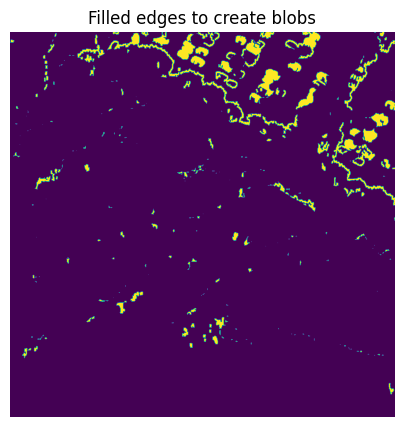

In [20]:
#We chose the image with the (3,7) kernel
img_edges, dilated, contours = edge_detector(bands_transposed, gaussian_thresh=15, kernel = (3,7))

# Create an empty black image with the same size as the 'dilated' image
filled_edges = np.zeros_like(dilated)

# Draw and fill all the contours on the empty image ('filled_edges')
# The contours are filled with white color (255, 255, 255)
# The thickness=cv2.FILLED ensures that the contours are completely filled
c = cv2.drawContours(filled_edges, contours, -1, (255, 255, 255), thickness=cv2.FILLED)
c = c * ~filtered_mask

# Create a figure with two subplots for visualizing the images
fig, axs = plt.subplots(ncols=1, figsize=(15, 5))

# Display the image with filled contours (blobs) in the first subplot
axs.imshow(c)
axs.set_title("Filled edges to create blobs")  # Set the title for the plot
axs.axis("off")  # Hide the axis for a cleaner view


To get rid of the long lines, it's necessary to eroded the edges.

(-0.5, 1499.5, 1499.5, -0.5)

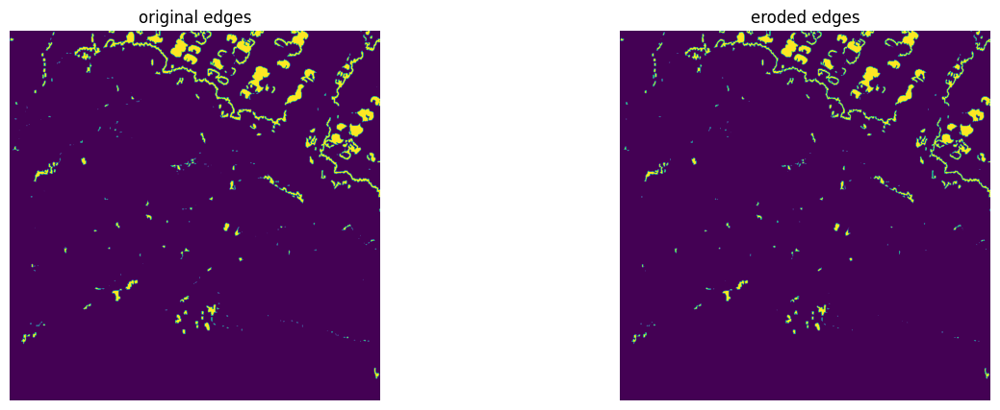

In [26]:
# Now we want to erode the binary to remove some connecting noise
structuring_element = skimage.morphology.square(2)
c_eroded = skimage.morphology.binary_erosion(c, structuring_element)

# Create the figure for subplots
fig, axs = plt.subplots(ncols=2, figsize=(15, 5))

# Plot original edges
axs[0].imshow(c)
axs[0].set_title(f"original edges")
axs[0].axis("off")

# Plot eroded edges
axs[1].imshow(c_eroded)
axs[1].set_title(f"eroded edges")
axs[1].axis("off")

#### **Blob detection**
Now, we want to figure out where the blobs are. Blobs are going to be of a particular size in this image, so we are filtering by some thresholds.

In [21]:
def blob_detector(image_array, min_size=3000, max_size=6000, min_roundness=0.5):
    # Ensure the image is binary (0 or 255)
    binary_image = np.uint8(image_array > 0) * 255

    # Find external contours
    contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Create an output image to draw the valid blobs
    blobs = np.zeros_like(image_array)

    for contour in contours:
        area = cv2.contourArea(contour)
        if min_size <= area <= max_size:
            # Calculate the perimeter (arc length) of the contour
            perimeter = cv2.arcLength(contour, True)
            if perimeter == 0:
                continue  # Avoid division by zero

            # Compute circularity
            circularity = (4 * np.pi * area) / (perimeter * perimeter)

            # If the blob is round enough, draw it
            if circularity >= min_roundness:
                cv2.drawContours(blobs, [contour], -1, 255, thickness=cv2.FILLED)

    return blobs

Here we apply the blob detector

(-0.5, 1499.5, 1499.5, -0.5)

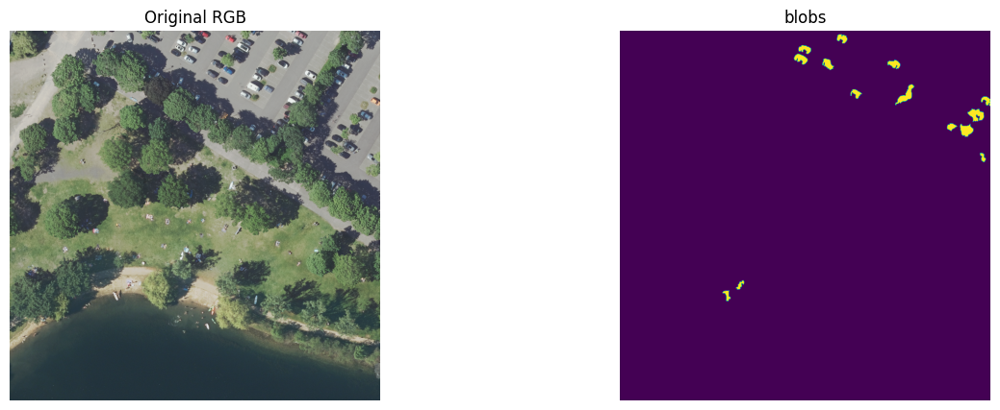

In [27]:
blobs = blob_detector(c_eroded.astype(np.uint8), min_size=400, max_size=4000, min_roundness=0.3)

# Create the figure for subplots
fig, axs = plt.subplots(ncols=2, figsize=(15, 5))

# Plot RGB, Average RGB Reflectance, and NDVI
axs[0].imshow(rgb)
axs[0].set_title("Original RGB")
axs[0].axis("off")

# Plot blobs
axs[1].imshow(blobs)
axs[1].set_title("blobs")
axs[1].axis("off")

Finally, it's possible to see the cars in the image. This result allow to zoom in.

In [28]:
px.imshow(blobs.reshape(1500,1500,1) * rgb)

## **Conclusion & Further thoughts**

This notebook has applied edge-based segmentation to detect cars in the example image. In next steps is possible to choose different edge detector like Laplace or Sobel itself. Change parameter like the kernel size or the Gaussian threshold.